# Explore Raw Permits — Disaster-Affected Places

Raw (unprocessed) time series plots for all disaster-affected places.
Includes small multiples, and per-group plots with survey gap
shading and disaster date markers.

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import re
from pathlib import Path

PROJECT_DIR = Path.cwd()

# If running from notebooks/, go one level up to repo root
if PROJECT_DIR.name == "notebooks":
    PROJECT_DIR = PROJECT_DIR.parent

OUTPUT_DIR  = PROJECT_DIR / "output"
CONFIG_DIR  = PROJECT_DIR / "config"
FIGURES_DIR = PROJECT_DIR / "figures"
FIGURES_DIR.mkdir(exist_ok=True)

style_path = PROJECT_DIR / "paper.mplstyle"
if style_path.exists():
    plt.style.use(str(style_path))
else:
    print("Warning: paper.mplstyle not found, using default matplotlib style.")

plt.style.use(str(PROJECT_DIR / 'paper.mplstyle'))

# Load panel
panel = pd.read_csv(OUTPUT_DIR / 'permits_panel.csv')
panel['date'] = pd.to_datetime(
    panel['year'].astype(str) + '-' + panel['month'].astype(str) + '-01')
panel = panel.sort_values(['metro_canonical', 'date']).reset_index(drop=True)

# ── Load place selections from CSVs ──
hurr_csv = pd.read_csv(OUTPUT_DIR / 'hurricane_places.csv',
                        dtype={'place_id': str})
nonhurr_csv = pd.read_csv(CONFIG_DIR / 'nonhurr_place_selections.csv',
                           dtype={'place_id': str})
hurr_csv['place_id'] = hurr_csv['place_id'].str.zfill(8)
nonhurr_csv['place_id'] = nonhurr_csv['place_id'].str.zfill(8)

STATE_FIPS = {
    '01':'AL','02':'AK','04':'AZ','05':'AR','06':'CA','08':'CO','09':'CT',
    '10':'DE','11':'DC','12':'FL','13':'GA','15':'HI','16':'ID','17':'IL',
    '18':'IN','19':'IA','20':'KS','21':'KY','22':'LA','23':'ME','24':'MD',
    '25':'MA','26':'MI','27':'MN','28':'MS','29':'MO','30':'MT','31':'NE',
    '32':'NV','33':'NH','34':'NJ','35':'NM','36':'NY','37':'NC','38':'ND',
    '39':'OH','40':'OK','41':'OR','42':'PA','44':'RI','45':'SC','46':'SD',
    '47':'TN','48':'TX','49':'UT','50':'VT','51':'VA','53':'WA','54':'WV',
    '55':'WI','56':'WY','72':'PR','78':'VI',
}

def make_pseudo_name(bps_name, state_abbr):
    """Convert BPS place name to compact pseudo-metro display name."""
    name = bps_name.strip()
    name = re.sub(r'\s+County\s+Unincorporated\s+Area$', ' Co. (unincorp.)', name)
    name = re.sub(r'(\s+Parish)\s+Unincorporated\s+Area$', r'\1 (unincorp.)', name)
    name = re.sub(r'\s+County$', ' Co.', name)
    name = re.sub(r'\s+township$', ' twp.', name)
    name = re.sub(r'\s+city$', ' (city)', name)
    name = re.sub(r'^San Buenaventura$', 'Ventura', name)
    name = re.sub(r'\s+town$', '', name)
    return f"{name}, {state_abbr}"

# Build PLACE_PSEUDOS
PLACE_PSEUDOS = {}
for _, r in hurr_csv.drop_duplicates('place_id').iterrows():
    st = STATE_FIPS.get(r['place_id'][:2], '??')
    PLACE_PSEUDOS[r['place_id']] = make_pseudo_name(r['place_name'], st)
for _, r in nonhurr_csv.iterrows():
    PLACE_PSEUDOS[r['place_id']] = r['pseudo_name']
pseudo_names = sorted(set(PLACE_PSEUDOS.values()))

# ── Build event dicts from CSVs ──
def _sort_events_by_date(d):
    return dict(sorted(d.items(), key=lambda kv: min(e[0] for e in kv[1])))

# Hurricane events (all >15% reg rate)
hurr_events = {}
for _, r in hurr_csv.iterrows():
    pname = PLACE_PSEUDOS[r['place_id']]
    hurr_events.setdefault(pname, []).append(
        [r['hurricane_date'], r['hurricane_name'], None])
for k in hurr_events:
    seen = set()
    deduped = []
    for e in hurr_events[k]:
        key = (e[0], e[1])
        if key not in seen:
            seen.add(key)
            deduped.append(e)
    hurr_events[k] = sorted(deduped)
hurr_events = _sort_events_by_date(hurr_events) if hurr_events else {}

fire_events = {}
tornado_events = {}
earthquake_events = {}
for _, r in nonhurr_csv.iterrows():
    pname = r['pseudo_name']
    dn = int(r['dn_csv']) if pd.notna(r['dn_csv']) else None
    event = [r['date_csv'], r['disaster'], dn]
    if r['type'] == 'Fire':
        fire_events.setdefault(pname, []).append(event)
    elif r['type'] == 'Tornado':
        tornado_events.setdefault(pname, []).append(event)
    elif r['type'] == 'Earthquake':
        earthquake_events.setdefault(pname, []).append(event)
for d in [fire_events, tornado_events, earthquake_events]:
    for k in d:
        d[k].sort()
fire_events = _sort_events_by_date(fire_events) if fire_events else {}
tornado_events = _sort_events_by_date(tornado_events) if tornado_events else {}
earthquake_events = _sort_events_by_date(earthquake_events) if earthquake_events else {}

# All events combined
all_events = {}
for d in [fire_events, hurr_events, tornado_events, earthquake_events]:
    for k, v in d.items():
        all_events.setdefault(k, []).extend(v)
place_order = sorted(all_events.keys(),
                     key=lambda p: min(e[0] for e in all_events[p]))

# ── Detect survey gaps from panel data ──
pseudo_panel = panel[panel['is_pseudo'] == True].copy()
gap_info = {}
for pname in pseudo_names:
    pdata = pseudo_panel[pseudo_panel['metro_canonical'] == pname]
    if len(pdata) == 0:
        gap_info[pname] = None
        continue
    dates = set(pdata['date'])
    full_range = pd.date_range(min(dates), max(dates), freq='MS')
    missing = sorted(set(full_range) - dates)
    if len(missing) <= 2:
        gap_info[pname] = None
        continue
    gaps = []
    cs, ce = missing[0], missing[0]
    for i in range(1, len(missing)):
        if (missing[i] - ce).days <= 35:
            ce = missing[i]
        else:
            n = len(pd.date_range(cs, ce, freq='MS'))
            if n >= 6:
                gaps.append({'start': cs.strftime('%Y-%m'),
                             'end': ce.strftime('%Y-%m'), 'months': n})
            cs, ce = missing[i], missing[i]
    n = len(pd.date_range(cs, ce, freq='MS'))
    if n >= 6:
        gaps.append({'start': cs.strftime('%Y-%m'),
                     'end': ce.strftime('%Y-%m'), 'months': n})
    gap_info[pname] = gaps if gaps else None

# ── Load place exclusions (optional file, keyed by place_id) ──
_excl_path = CONFIG_DIR / 'place_exclusions.csv'
EXCLUDED_PLACES = set()
EXCLUSION_NOTES = {}
if _excl_path.exists():
    _excl_df = pd.read_csv(_excl_path, dtype={'place_id': str})
    _excl_df['place_id'] = _excl_df['place_id'].str.zfill(8)
    for _, _r in _excl_df[_excl_df['exclude'] == 1].iterrows():
        pname = PLACE_PSEUDOS.get(_r['place_id'])
        if pname:
            EXCLUDED_PLACES.add(pname)
            EXCLUSION_NOTES[pname] = _r.get('notes', '')

print(f"Panel: {panel['metro_canonical'].nunique()} entries, "
      f"{len(pseudo_panel):,} pseudo-metro rows "
      f"({pseudo_panel['metro_canonical'].nunique()} places)")
print(f"Events: {len(fire_events)} fire, {len(hurr_events)} hurricane, "
      f"{len(tornado_events)} tornado, {len(earthquake_events)} earthquake — {len(all_events)} places total")
if EXCLUDED_PLACES:
    print(f"Excluded from analysis: {len(EXCLUDED_PLACES)} places "
          f"({', '.join(sorted(EXCLUDED_PLACES))})")
print(f"Sorted by disaster date: {place_order[0]} ... {place_order[-1]}")


# --- Helper: display-friendly labels ---
def display_label(name):
    """Clean up place names for plot labels."""
    return (name
            .replace(' Co. (unincorp.)', ' County')
            .replace(' (unincorp.)', '')
            .replace(' (city)', ''))


# --- Helper: fill gaps with NaN so matplotlib breaks the line ---
def fill_date_gaps(subset):
    """Reindex a place's data to full monthly range; gaps become NaN."""
    subset = subset.drop_duplicates(subset='date').set_index('date').sort_index()
    if subset.empty:
        return subset
    full = pd.date_range(subset.index.min(), subset.index.max(), freq='MS')
    return subset.reindex(full)


Panel: 665 entries, 78,082 pseudo-metro rows (268 places)
Events: 11 fire, 253 hurricane, 2 tornado, 2 earthquake — 268 places total
Excluded from analysis: 26 places (Beaumont, TX, Butte Co. (unincorp.), CA, Calcasieu Parish (unincorp.), LA, Charlotte Co. (unincorp.), FL, Grand Isle, LA, Jefferson Co. (unincorp.), TX, Jefferson Parish (unincorp.), LA, Kenner, LA, Lake Charles, LA, Mandeville, LA, Napa, CA, New Orleans, LA, Paradise, CA, Plaquemines Parish, LA, Ponchatoula, LA, Ridgecrest, CA, Slidell, LA, St. Bernard Parish, LA, St. Charles Parish, LA, St. John the Baptist Parish, LA, St. Tammany Parish (unincorp.), LA, Superior, CO, Tangipahoa Parish (unincorp.), LA, Terrebonne Parish, LA, Ventura Co. (unincorp.), CA, Ventura, CA)
Sorted by disaster date: Charlotte Co. (unincorp.), FL ... Maui Co., HI


## Top 5 Places by Total Permits

Top 5 disaster-affected places by total SF permits:
  1. Lee Co. (unincorp.), FL: 91,749
  2. Port St. Lucie, FL: 60,368
  3. Cape Coral, FL: 57,065
  4. Dade Co. (unincorp.), FL: 56,031
  5. Charlotte Co. (unincorp.), FL: 40,272


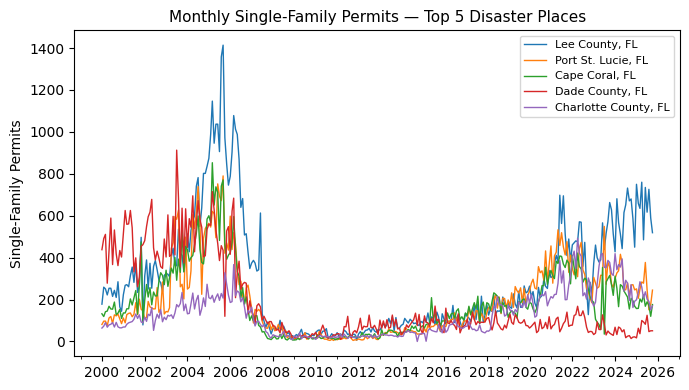

In [13]:
# Rank places by total single-family permits
place_totals = (pseudo_panel.groupby('metro_canonical')['units_1']
                .sum().sort_values(ascending=False))
top5 = place_totals.head(5).index.tolist()

print("Top 5 disaster-affected places by total SF permits:")
for i, p in enumerate(top5, 1):
    print(f"  {i}. {p}: {place_totals[p]:,.0f}")

fig, ax = plt.subplots(figsize=(7, 4))
for place in top5:
    subset = pseudo_panel[pseudo_panel['metro_canonical'] == place].sort_values('date')
    filled = fill_date_gaps(subset)
    ax.plot(filled.index, filled['units_1'],
            label=display_label(place), linewidth=1)

    # Shade gaps
    gi = gap_info.get(place)
    if gi:
        for g in gi:
            ax.axvspan(pd.Timestamp(g['start'] + '-01'),
                       pd.Timestamp(g['end'] + '-01') + pd.offsets.MonthEnd(1),
                       alpha=0.12, color='gray', zorder=0)

ax.set_ylabel('Single-Family Permits')
ax.set_title('Monthly Single-Family Permits \u2014 Top 5 Disaster Places')
ax.legend(fontsize=8)
ax.xaxis.set_major_locator(mdates.YearLocator(2))
ax.xaxis.set_minor_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.tight_layout()
fig.savefig(FIGURES_DIR / 'fig_top5_places_raw.pdf',
            bbox_inches='tight', dpi=150)
plt.show()

## 12-Month Moving Average

In [16]:
# Compute 12-month moving average for pseudo-metros
pseudo_panel = pseudo_panel.sort_values(['metro_canonical', 'date'])
pseudo_panel['sf_ma12'] = (pseudo_panel.groupby('metro_canonical')['units_1']
    .transform(lambda x: x.rolling(12, min_periods=12).mean()))

# Use disaster-date ordering (computed in cell 1)
n_places = len(place_order)
print(f"Computed MA for {n_places} places "
      f"(sorted by disaster date)")

Computed MA for 268 places (sorted by disaster date)


## Small Multiples — All Disaster-Affected Places

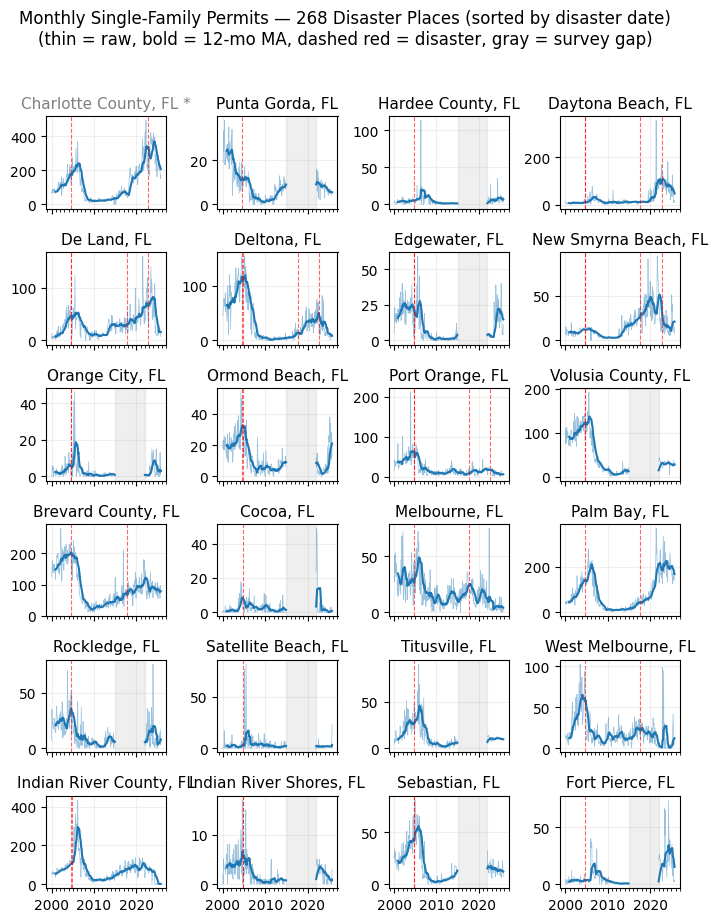

Figure a: places 1–24 of 268


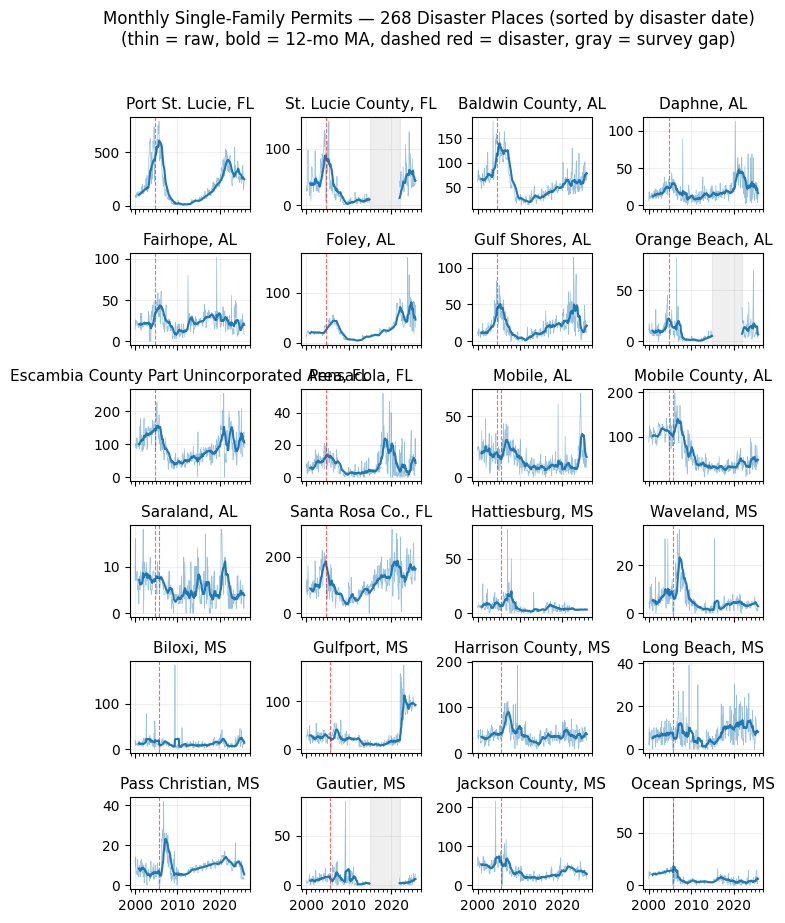

Figure b: places 25–48 of 268


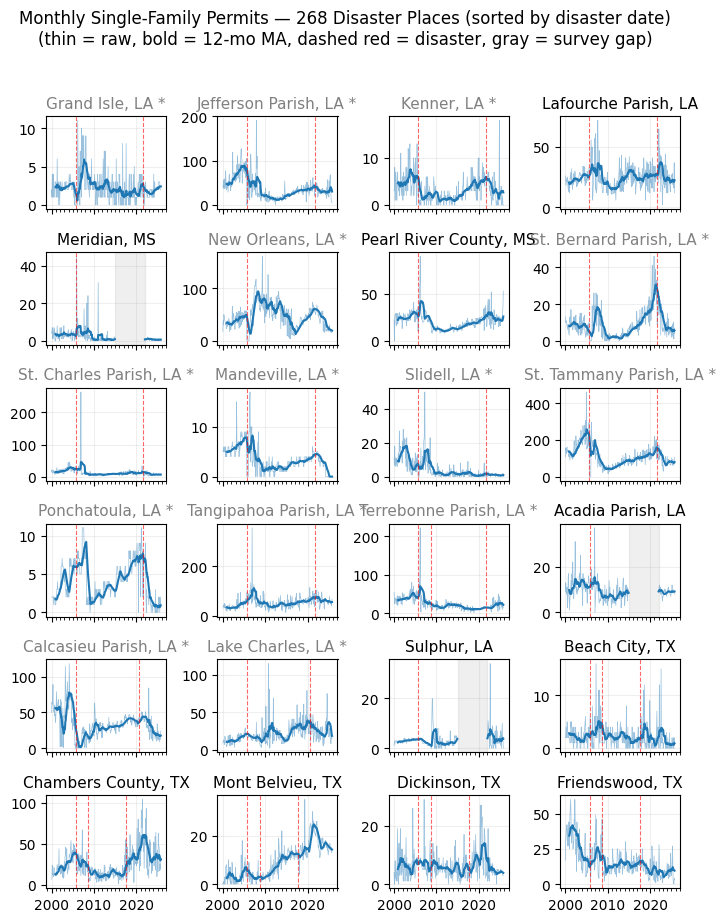

Figure c: places 49–72 of 268


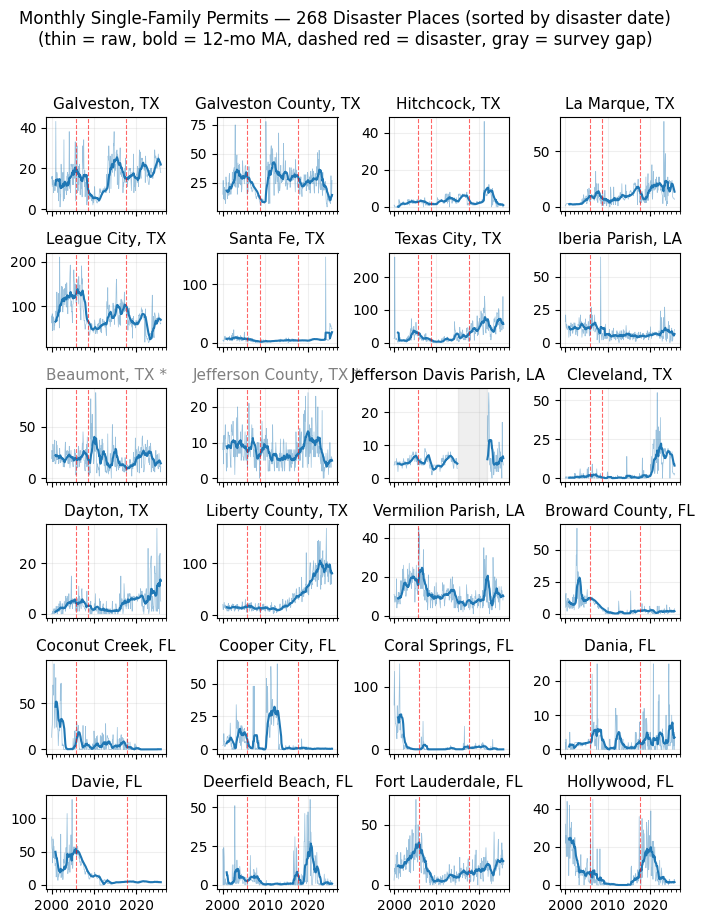

Figure d: places 73–96 of 268


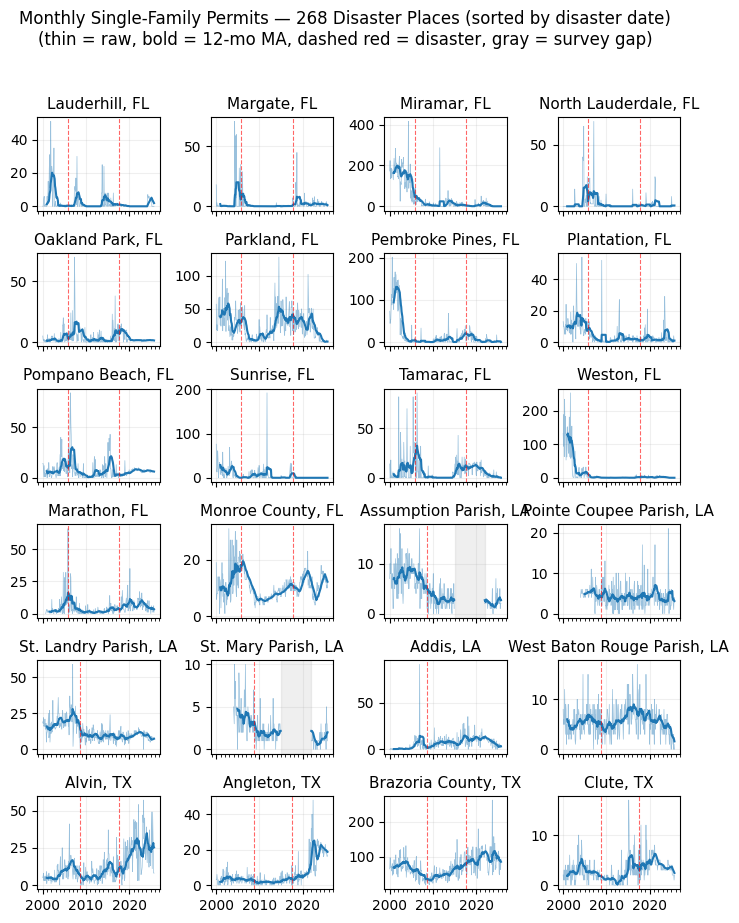

Figure e: places 97–120 of 268


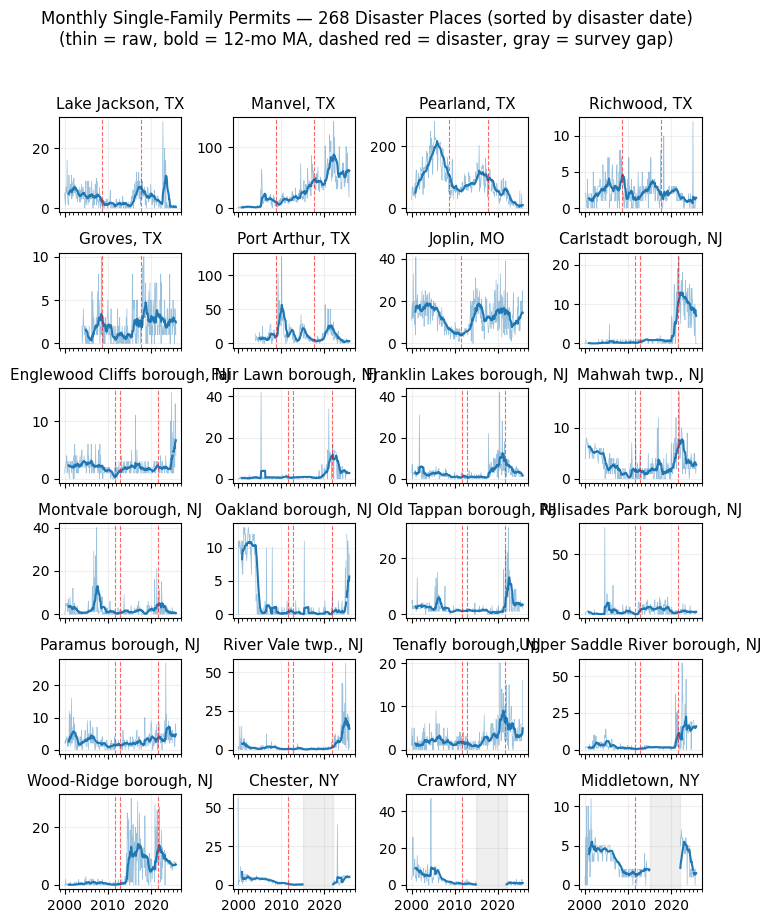

Figure f: places 121–144 of 268


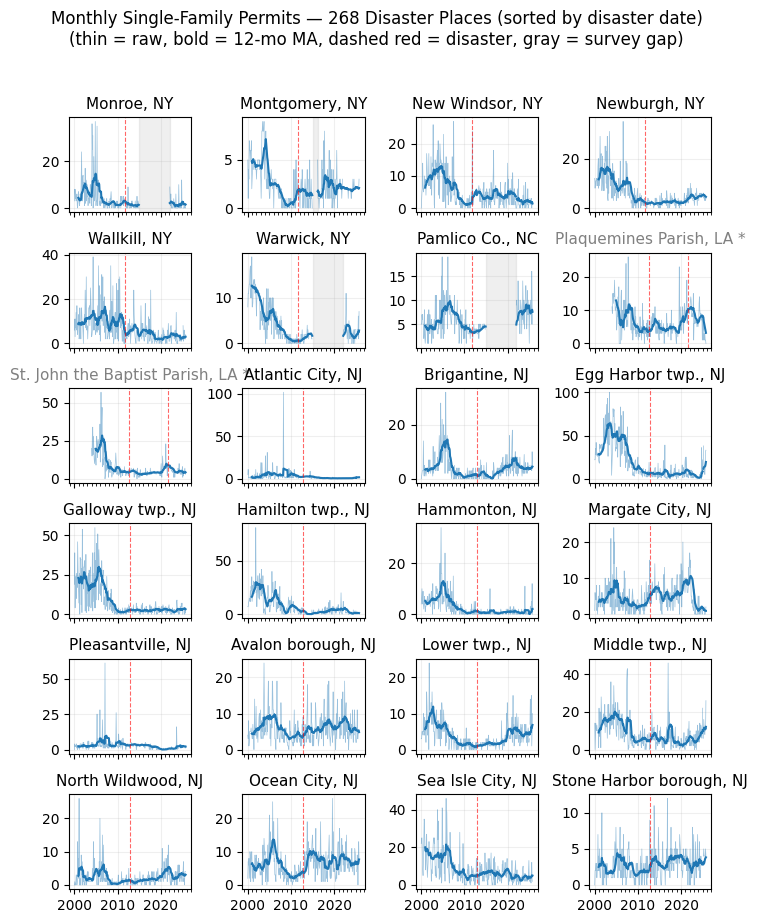

Figure g: places 145–168 of 268


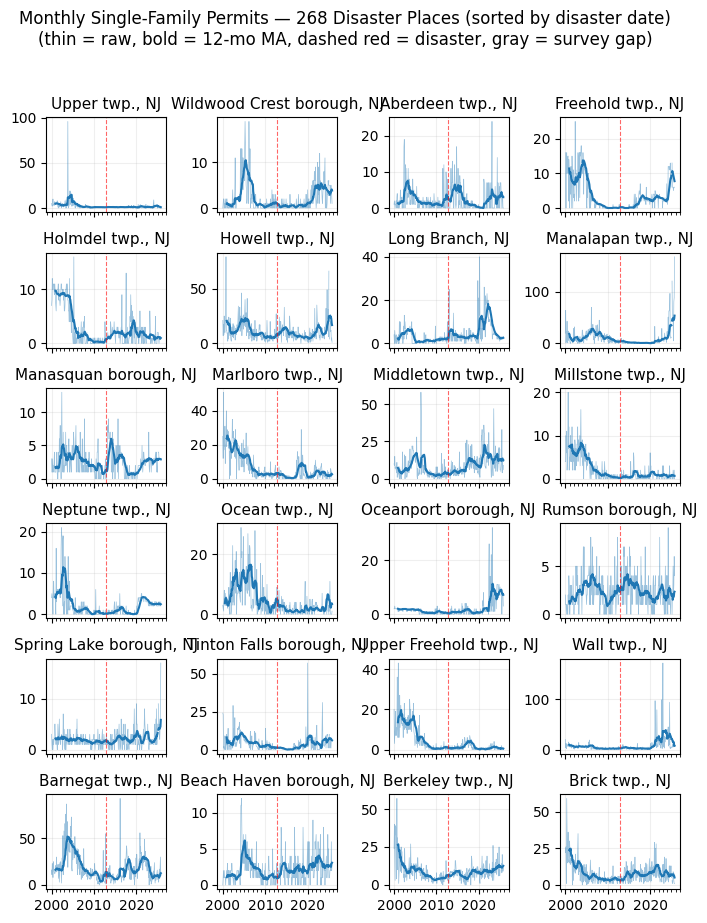

Figure h: places 169–192 of 268


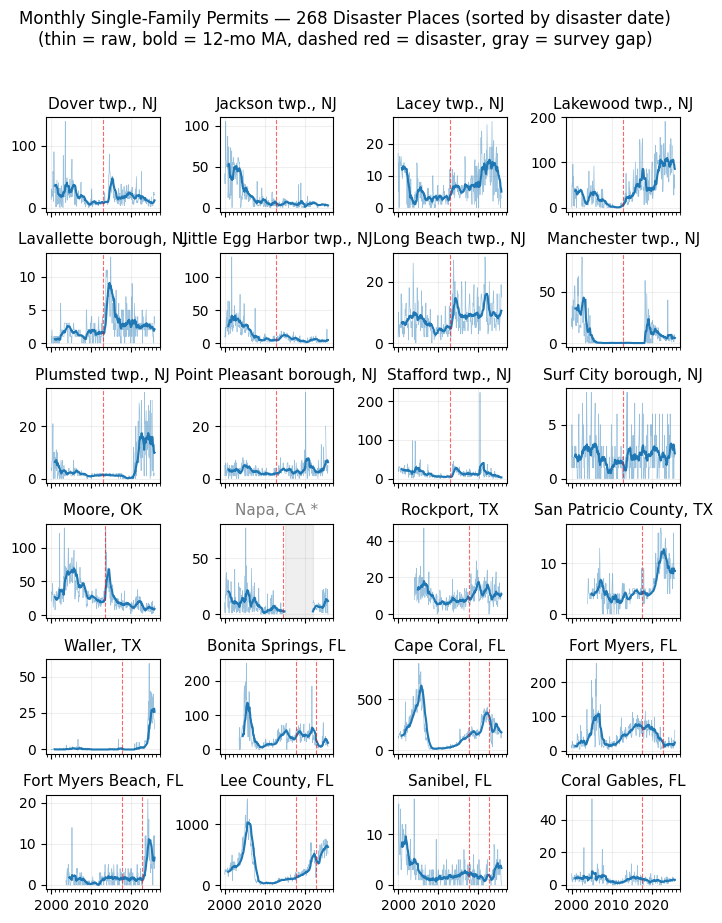

Figure i: places 193–216 of 268


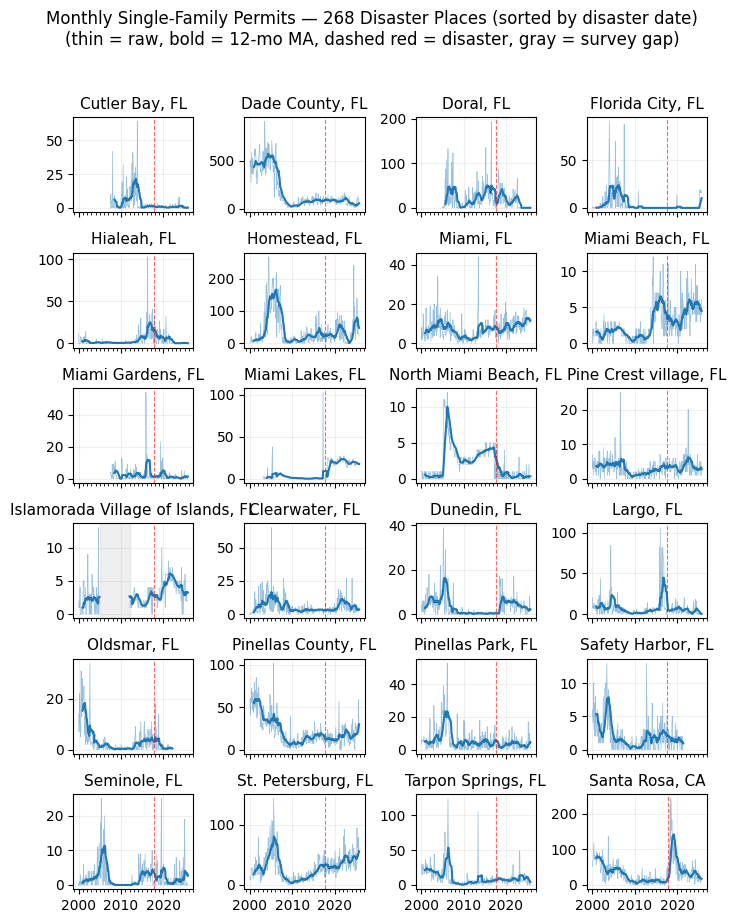

Figure j: places 217–240 of 268


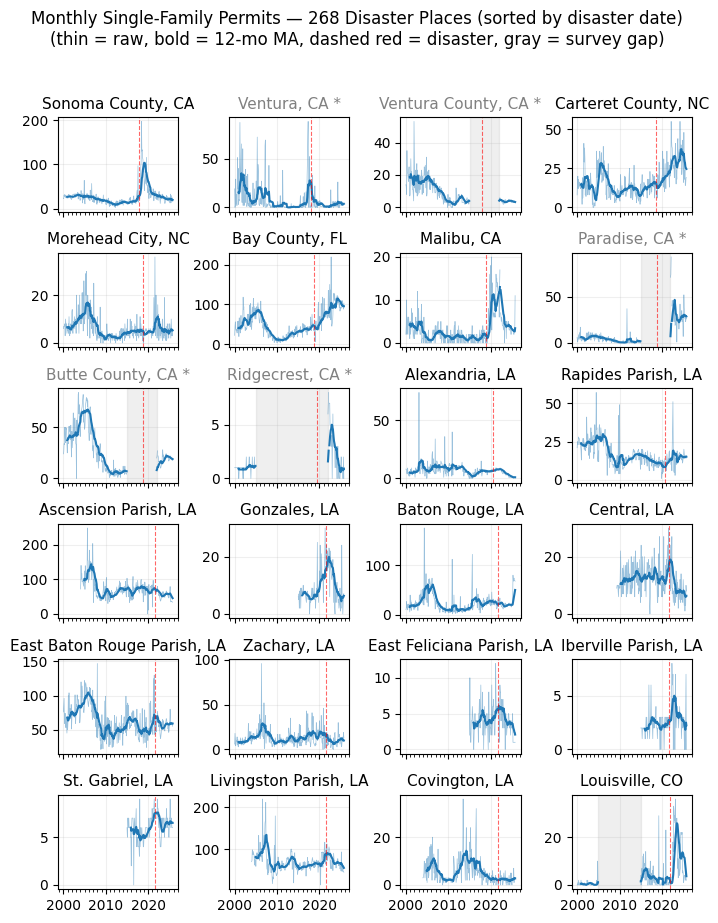

Figure k: places 241–264 of 268


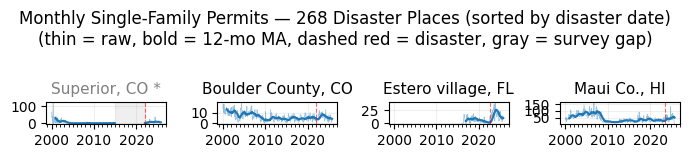

Figure l: places 265–268 of 268


In [19]:
n_places = len(place_order)
ncols = 4
rows_per_fig = 6
places_per_fig = rows_per_fig * ncols  # 24

n_figs = max(1, (n_places + places_per_fig - 1) // places_per_fig)

for fig_idx in range(n_figs):
    start = fig_idx * places_per_fig
    end = min(start + places_per_fig, n_places)
    n_this = end - start
    nrows = int(np.ceil(n_this / ncols))

    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(7, nrows * 1.5),
                             sharex=True)

    for idx, ax in enumerate(axes.flat):
        place_idx = start + idx
        if place_idx >= end:
            ax.set_visible(False)
            continue

        place = place_order[place_idx]
        subset = pseudo_panel[
            pseudo_panel['metro_canonical'] == place
        ].sort_values('date')
        filled = fill_date_gaps(subset)

        # Raw data (thin) — breaks at gaps
        ax.plot(filled.index, filled['units_1'],
                linewidth=0.5, alpha=0.45, color='C0')
        # 12-month MA (bold) — also breaks at gaps
        ax.plot(filled.index, filled['sf_ma12'],
                linewidth=1.5, color='C0')

        # Shade survey gaps
        gi = gap_info.get(place)
        if gi:
            for g in gi:
                ax.axvspan(
                    pd.Timestamp(g['start'] + '-01'),
                    pd.Timestamp(g['end'] + '-01')
                    + pd.offsets.MonthEnd(1),
                    alpha=0.12, color='gray', zorder=0)

        # Mark disaster dates
        events = all_events.get(place, [])
        for ev in events:
            ev_date = pd.Timestamp(ev[0])
            ax.axvline(ev_date, color='red',
                       linewidth=0.8, alpha=0.6,
                       linestyle='--')

        label = display_label(place)
        if place in EXCLUDED_PLACES:
            label += ' *'
            ax.set_title(label, color='0.5')
        else:
            ax.set_title(label)
        ax.grid(True, alpha=0.2)

    bottom_axes = axes[-1, :] if axes.ndim == 2 else axes
    for ax in np.atleast_1d(bottom_axes):
        ax.xaxis.set_major_locator(mdates.YearLocator(10))
        ax.xaxis.set_minor_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(
            mdates.DateFormatter('%Y'))

    suffix = chr(ord('a') + fig_idx)
    fig.suptitle(
        f'Monthly Single-Family Permits \u2014 '
        f'{n_places} Disaster Places (sorted by disaster date)\n'
        '(thin = raw, bold = 12-mo MA, '
        'dashed red = disaster, gray = survey gap)',
        y=1.02)
    plt.tight_layout()
    fig.savefig(
        FIGURES_DIR
        / f'fig_small_multiples_{n_places}places_{suffix}.pdf',
        bbox_inches='tight', dpi=150)
    plt.show()
    print(f"Figure {suffix}: places {start+1}\u2013"
          f"{end} of {n_places}")

## Per-Group Plots

In [21]:
def plot_raw_place_events(events_dict, title,
                          ncols=2, figsize_per_row=2.8):
    """Plot raw time series for a group of disaster places.

    Parameters
    ----------
    events_dict : dict
        {place_name: [(date_str, event_label, dn), ...]}
    title : str
        Figure suptitle.
    ncols : int
        Number of columns in subplot grid.
    figsize_per_row : float
        Height in inches per row.
    """
    places = list(events_dict.keys())
    nrows = int(np.ceil(len(places) / ncols))
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(7, figsize_per_row * nrows),
                             sharex=False)
    if nrows * ncols == 1:
        axes = np.array([axes])
    axes = axes.flat

    for idx, ax in enumerate(axes):
        if idx >= len(places):
            ax.set_visible(False)
            continue

        place = places[idx]
        subset = pseudo_panel[
            pseudo_panel['metro_canonical'] == place
        ].sort_values('date')

        if len(subset) == 0:
            ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
                    ha='center', va='center', color='gray')
            label = display_label(place)
            if place in EXCLUDED_PLACES:
                label += ' *'
                ax.set_title(label, fontweight='bold', color='0.5')
            else:
                ax.set_title(label, fontweight='bold')
            continue

        # Reindex to full date range so gaps break the line
        filled = fill_date_gaps(subset)

        # Raw permits
        ax.plot(filled.index, filled['units_1'],
                linewidth=0.7, alpha=0.5, color='C0')
        # 12-month MA
        ax.plot(filled.index, filled['sf_ma12'],
                linewidth=1.8, color='C0')

        # Gap shading
        gi = gap_info.get(place)
        if gi:
            for g in gi:
                gs = pd.Timestamp(g['start'] + '-01')
                ge = (pd.Timestamp(g['end'] + '-01')
                      + pd.offsets.MonthEnd(1))
                ax.axvspan(gs, ge, alpha=0.12,
                           color='gray', zorder=0)
                mid = gs + (ge - gs) / 2
                ax.text(mid, ax.get_ylim()[1] * 0.9,
                        'survey\ngap',
                        ha='center', va='top', fontsize=7,
                        color='gray', fontstyle='italic')

        # Event markers
        for ev in events_dict[place]:
            ev_date = pd.Timestamp(ev[0])
            ax.axvline(ev_date, color='red', linewidth=1,
                       alpha=0.7, linestyle='--')
            ax.text(ev_date, ax.get_ylim()[1] * 0.95,
                    f" {ev[1]}", rotation=90, va='top',
                    ha='left', fontsize=7, color='red')

        label = display_label(place)
        if place in EXCLUDED_PLACES:
            label += ' *'
            ax.set_title(label, fontweight='bold', color='0.5')
        else:
            ax.set_title(label, fontweight='bold')
        ax.set_ylabel('SF Permits')
        ax.xaxis.set_major_locator(mdates.YearLocator(5))
        ax.xaxis.set_minor_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(
            mdates.DateFormatter('%Y'))
        ax.grid(True, alpha=0.2)

    fig.suptitle(title, y=1.01)
    plt.tight_layout()
    return fig

### Wildfire Places

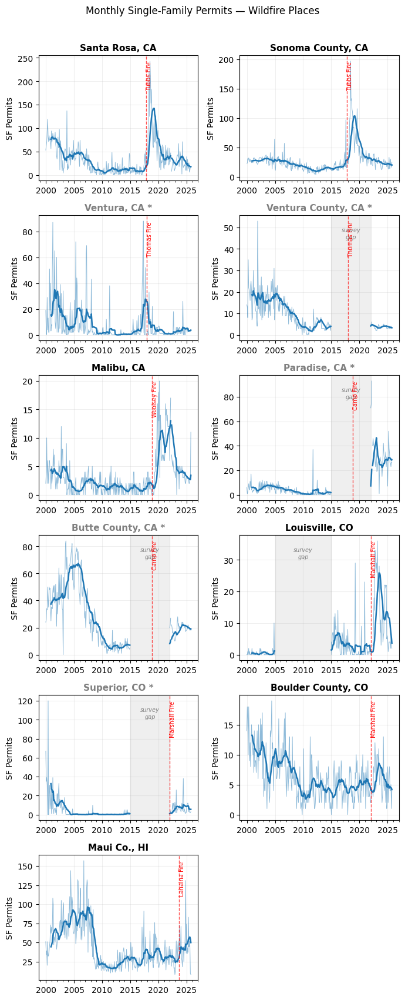

In [23]:
fig = plot_raw_place_events(fire_events,
    'Monthly Single-Family Permits \u2014 Wildfire Places')
fig.savefig(FIGURES_DIR / 'fig_raw_fire_places.pdf',
            bbox_inches='tight', dpi=150)
plt.show()

### Hurricane Places

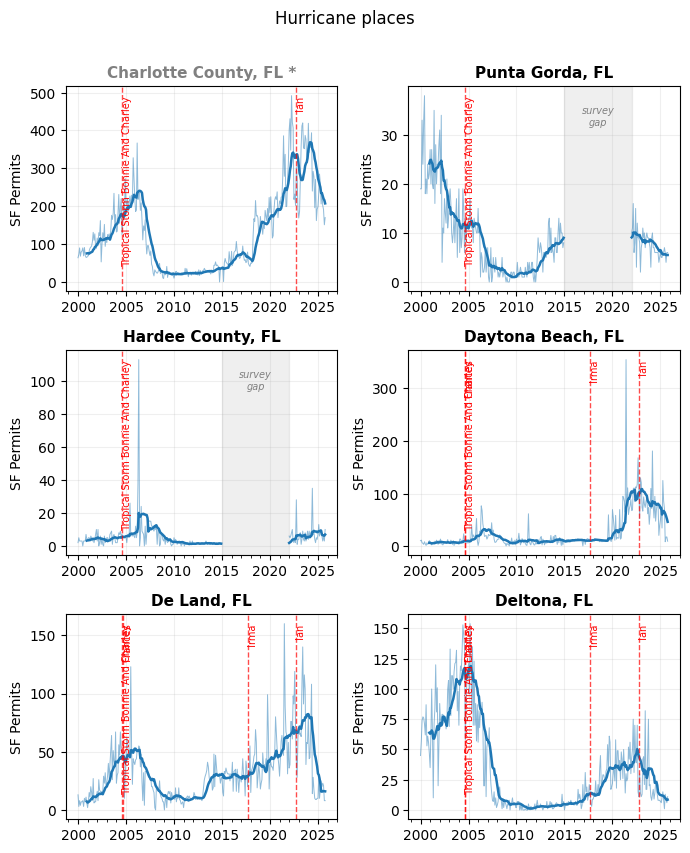

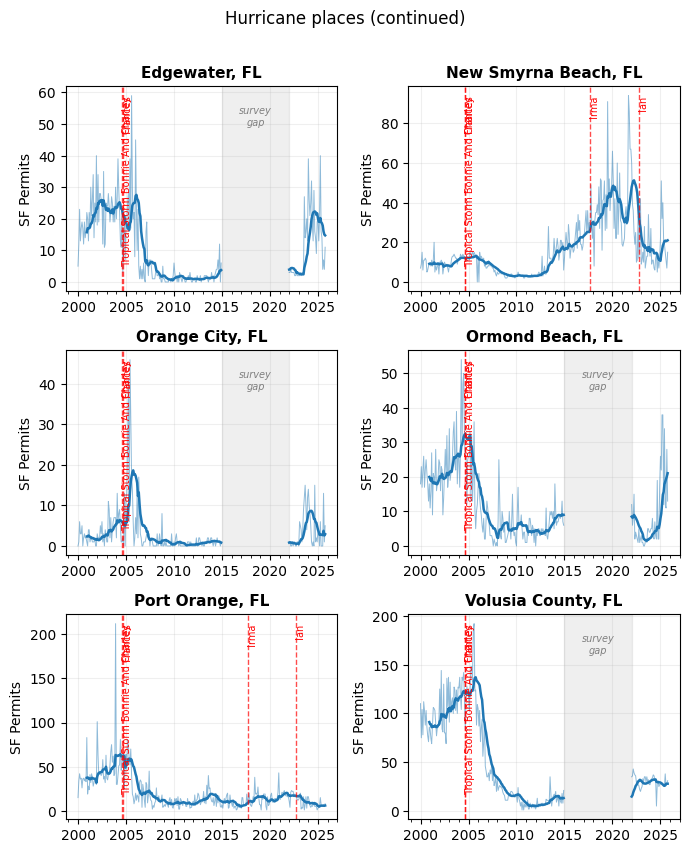

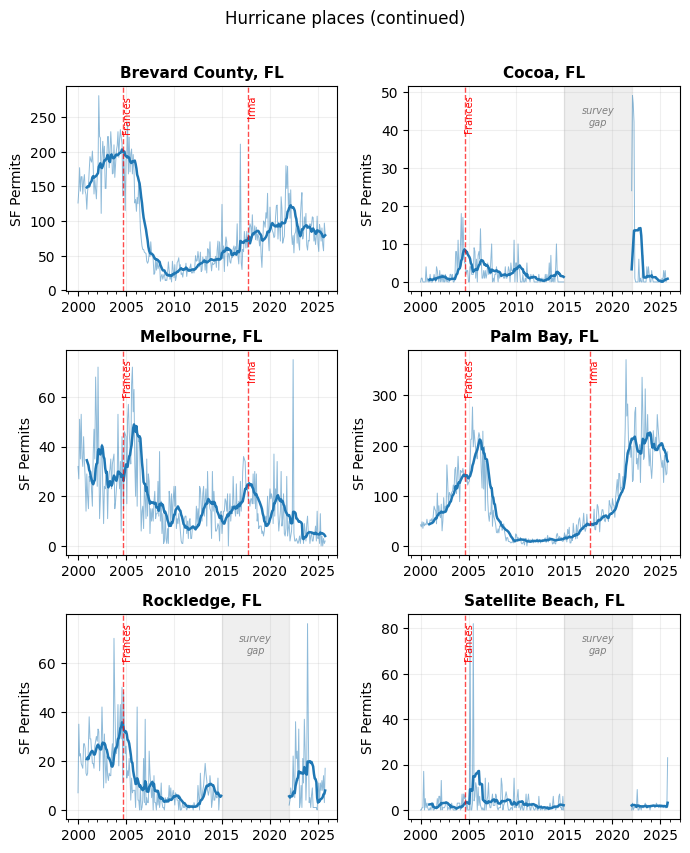

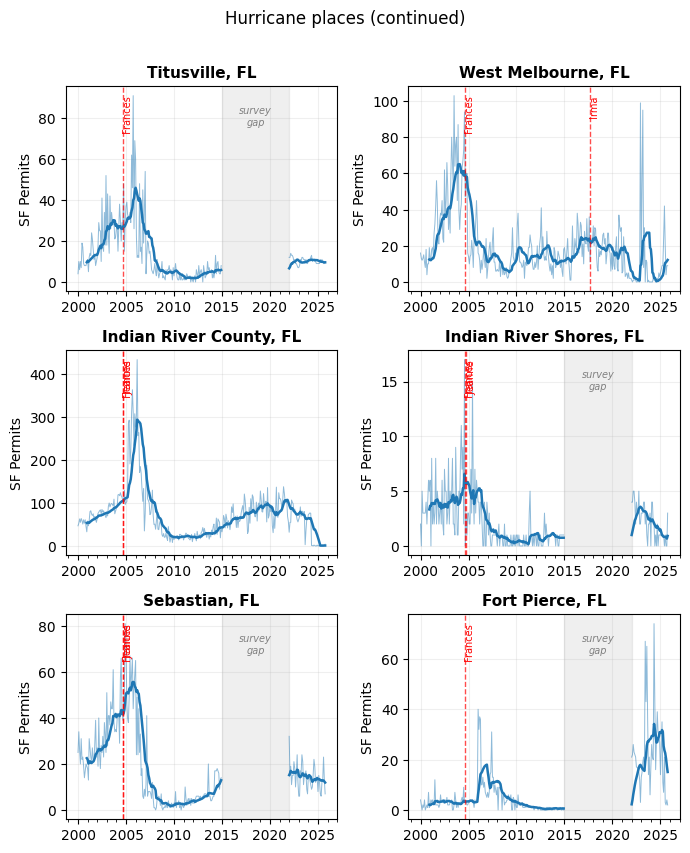

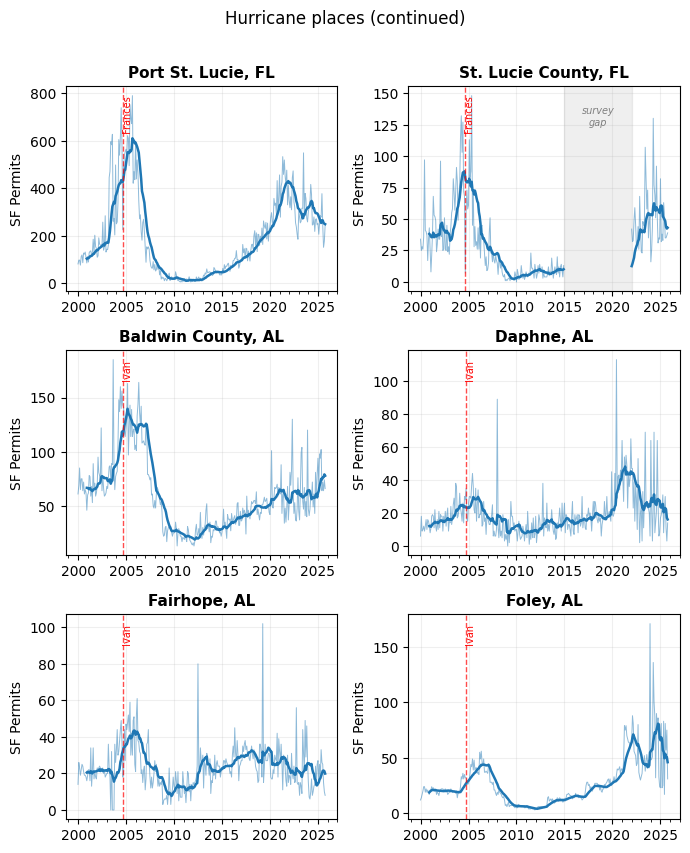

...

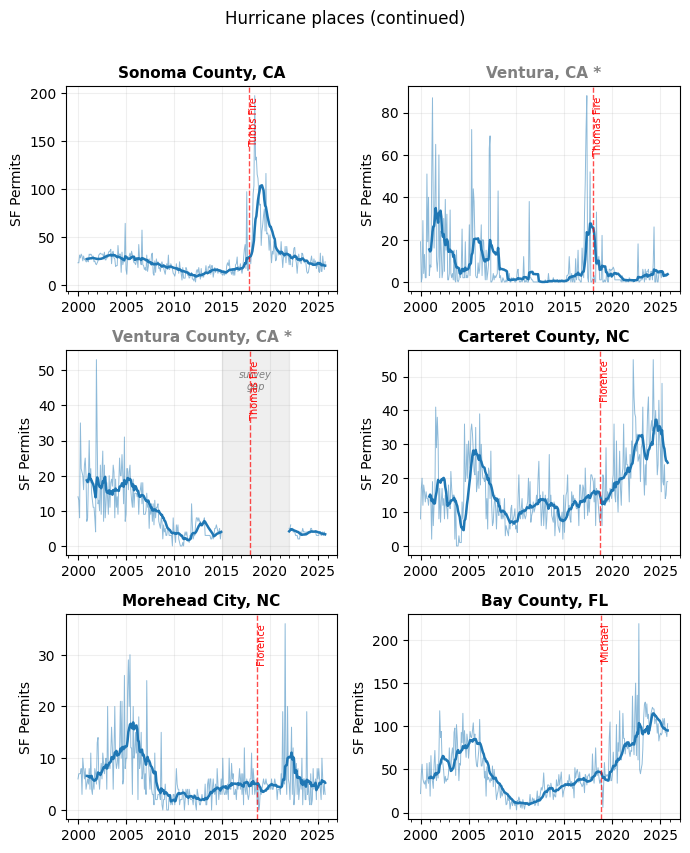

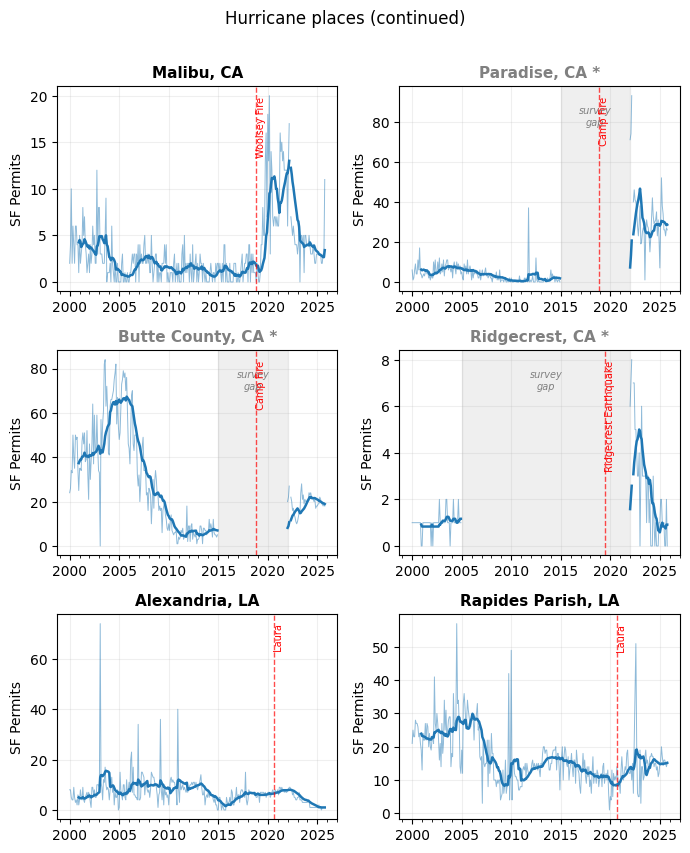

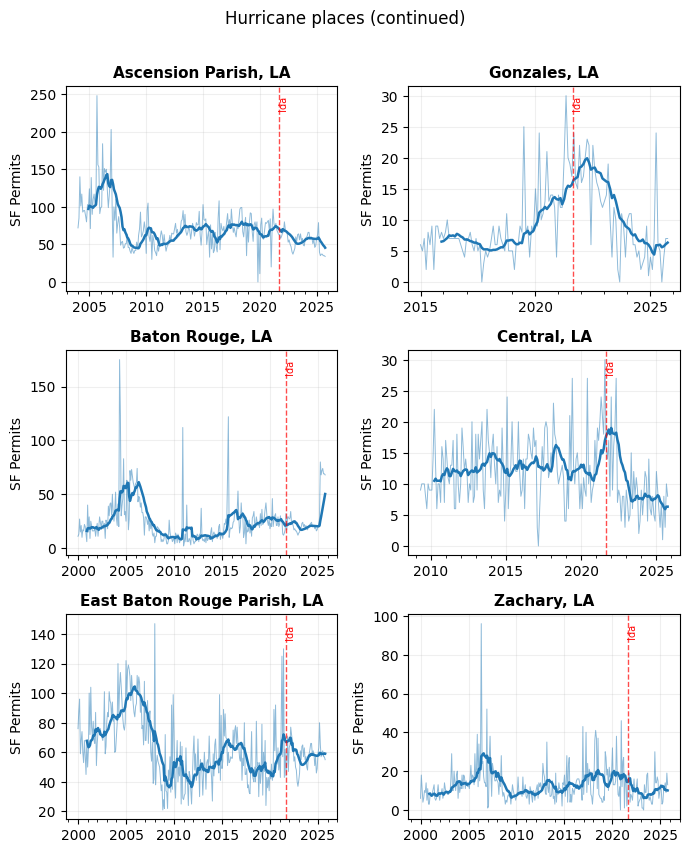

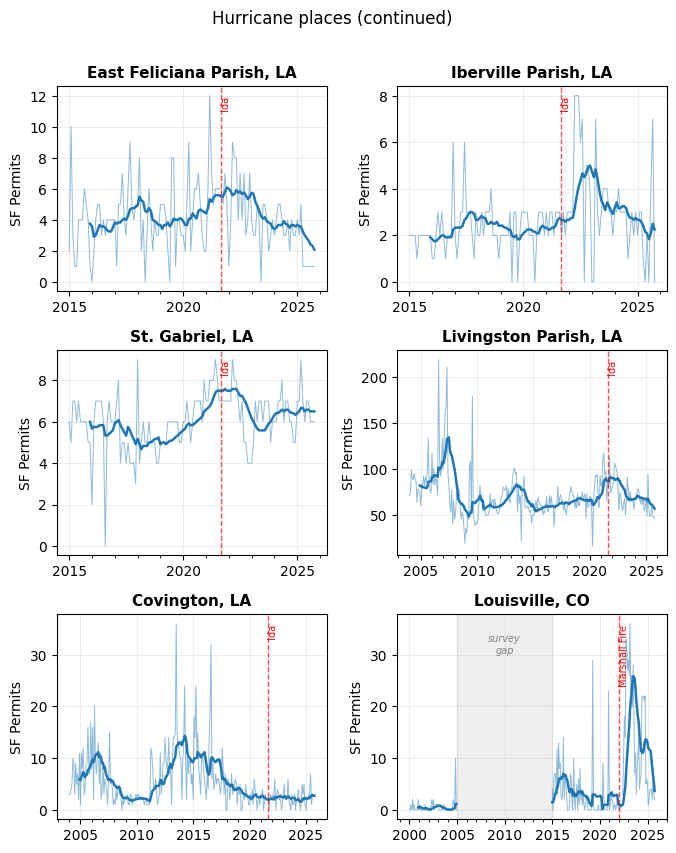

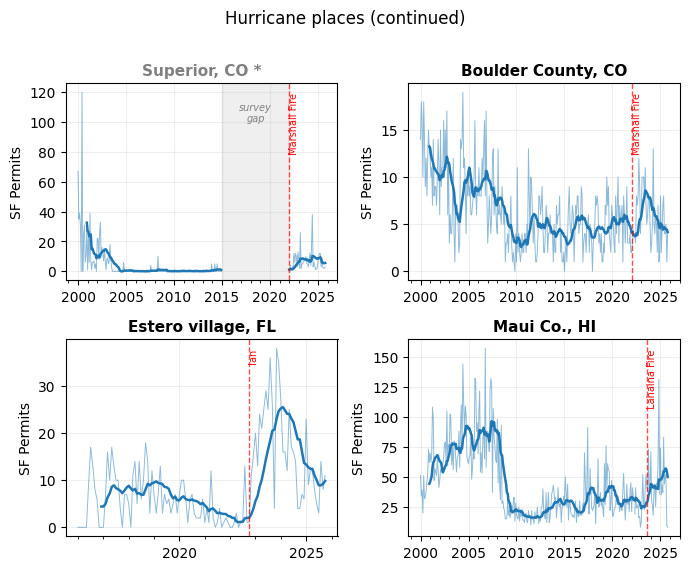

Hurricanes: 45 groups, 45 figures saved


In [35]:
import re

def split_list(lst, n):
    """Split list into chunks of size n"""
    return [lst[i:i+n] for i in range(0, len(lst), n)]
chunks = split_list(place_order, 6)

def safe_filename(s):
    """Replace characters not allowed in Windows file names."""
    return re.sub(r'[\\/:*?"<>|]', '_', str(s))

for i, chunk in enumerate(chunks):
    raw_suffix = f"{i}_{len(chunk)}places"
    safe_suffix = safe_filename(raw_suffix)
    title = "Hurricane places"
    if i > 0:
        title += " (continued)"
    chunk_dict = {p: all_events[p] for p in chunk}
    fig = plot_raw_place_events(chunk_dict, title)
    fig.savefig(
        FIGURES_DIR / f"fig_raw_hurricane_{safe_suffix}.pdf",
        bbox_inches="tight",
        dpi=150
    )
    plt.show()

print(f"Hurricanes: {len(chunks)} groups, {len(chunks)} figures saved")

### Tornadoes

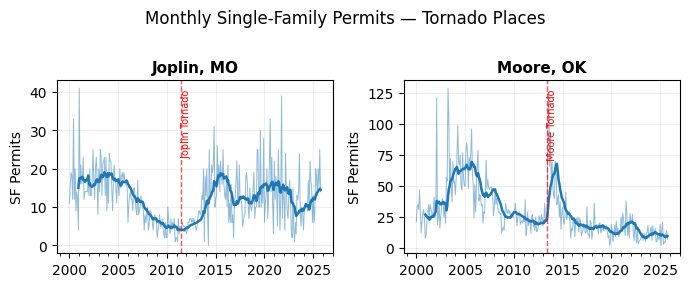

In [37]:
fig = plot_raw_place_events(tornado_events,
    'Monthly Single-Family Permits \u2014 Tornado Places')
fig.savefig(FIGURES_DIR / 'fig_raw_tornado_places.pdf',
            bbox_inches='tight', dpi=150)
plt.show()

### Earthquake Places

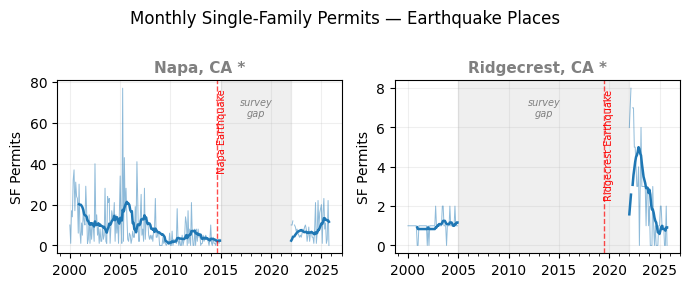

In [41]:
fig = plot_raw_place_events(earthquake_events,
    'Monthly Single-Family Permits \u2014 Earthquake Places')
fig.savefig(FIGURES_DIR / 'fig_raw_earthquake_places.pdf',
            bbox_inches='tight', dpi=150)
plt.show()


## Summary

All disaster-affected places have been plotted above. Key observations:
- **Survey gaps** (gray shading) affect several places between 2015-2021
- **Disaster dates** (red dashed lines) mark the events analyzed
- The raw data shows clear seasonal patterns in most places
- Some places show visible post-disaster permit surges (especially
  wildfire places like Santa Rosa, Paradise, and Butte County)